# Подбор толщин кессона при заданной массе

В документе представлено создание оптимизатора, подбирающего толщины обшивок и лонжеронов кессона по многокритериальным ограничениям.

### Постановка задачи

На определенном этапе проектирования, когда утверждены внешние обводы и массы агрегатов, необходимо подбирать поперечные сечения и толщины силовых элементов конструкции. При первых итераций расчетов, подбор  целесообразно проводить по критерию максимальной погонной изгибной жесткости констукции (далее изгибная жесткость). 

### Обозначения и единицы измерения величин

В документе применяются условные обозначения

| Параметр | Обозначение | Единицы измерения |
|:---------|:--------|:------------------|
| Линейные размеры | $\delta$ | $мм$ |
| Площадь поперечного сечения | $F$ | $мм^2$ |
|Модуль упругости | $E$ | $МПа$ |
| Плотность | $\rho$ | $т/мм^{3}$ |
| Момент | $M_x$ | $Нмм$ |
| Масса | $m$ | $т$ |
| Погонная жесткость | $EJ_{x}$ | $Нмм^2 / рад$ |

# Подготовка данных 

Для подготовки данных создана конечно-элементная модель (КЭМ) **регулярной зоны** кессона состоящая из:
1. двух обшивок - верхней и нижней
2. двух лонжеронов - передний и задний
3. четырех нервюр.


К конструкции приложен момент $M_x = 10 000 Нмм$ в локальной системе координат (ЛСК).
Направления ЛСК:
* *xOy* - в плоскости нервюры
* *z* - по условной оси жесткости (УОЖ)

Материал всех элементов конструкции - алюминий:
* модуль упругости $E = 70 000 МПа$
* плотность $\rho = 2,77 {\cdot} 10^{-9} т/мм^{3}$



Внешний вид КЭМ (верхняя обшивка показана полупрозрачно):

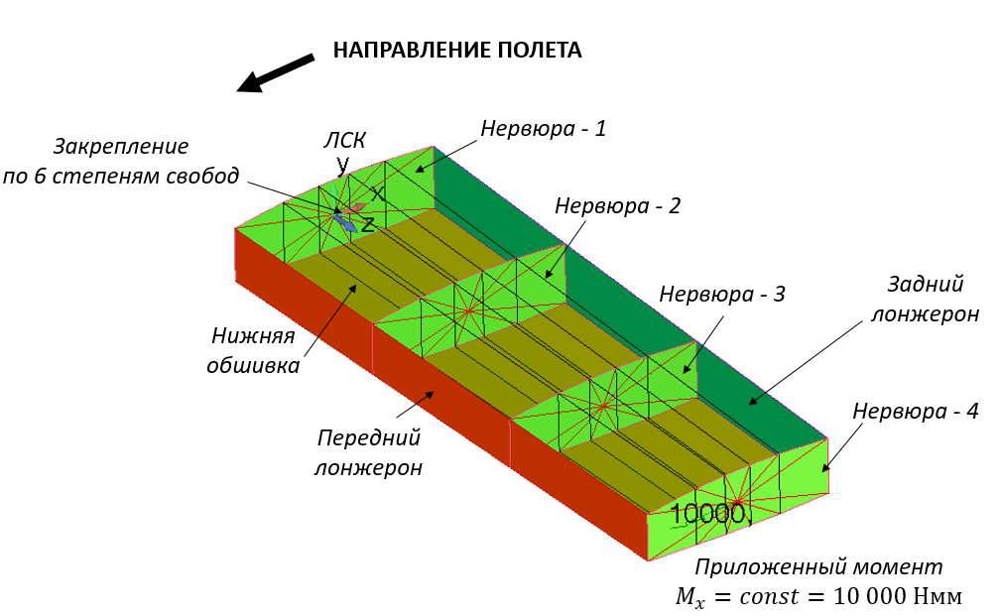

Пояса лонжеронов, нервюр и толщины стенок нервюр в данной задаче в оптимизации не участвуют (заморожены). Подбор осуществляется только для:
* толщин лонжеронов - $\delta_{long front}$, $\delta_{long back}$
* толщин обшивок - $\delta_{skin top}$, $\delta_{skin bot}$.

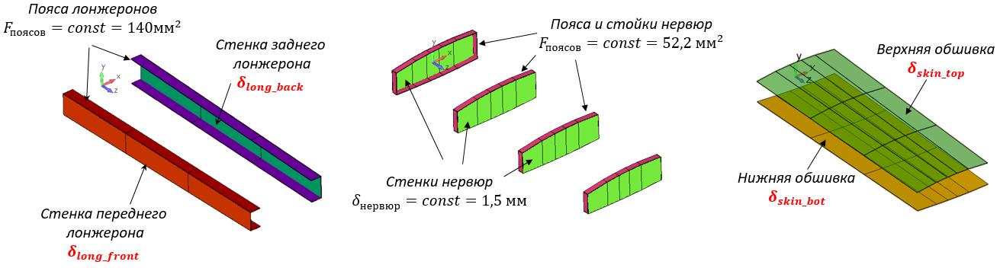

###  Критерии оптимизациии

Оптимизация проводится по трем критериям:
1. минимальное отклонение от заданной массы (утвержденной).

Заданная масса $M_{target}, кг$ является исходным данным к задаче оптимизации. Единицы измерения *кг* введены для удобства пользователей оптимизатора. При расчетах в документе масса измеряется в *т*.

Масса кессона $m$, с подобранными толщинами силовых элементов, предсказывается сетью - *метамоделью конструкции*.

2. максимальное значение изгибной жесткости.

Изгибная жесткость $EJ$ предсказывается сетью - *метамоделью конструкции*.
   
3. учет технологических требований к толщинам.

Технологическими ограничениями являются толщины листов по **ГОСТ 21631-2019**.  
В данной задаче толщины подбираются из диапазона:    
***0.8, 0.9, 1.0, 1.2, 1.5, 1.6, 1.8, 1.9, 2.0, 2.5*** *мм*

### Импорт библиотек

In [1]:
import pandas as pd

import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from phik import phik_matrix
from phik.report import plot_correlation_matrix

import itertools

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

import random
import joblib

import os

## Создание исходных данных

В текущем разделе документа представлены этапы для:
1. генерации расчетов в среде Femap
2. обработки результатов расчета КЭМ

#### Константы раздела

In [2]:
#список толщин участвующих в расчетах
delta_lista = [0.8, 0.9, 1.0, 1.2, 1.5, 1.6, 1.8, 1.9, 2.0, 2.5]

#список названий свойств - итерируемые параметры
list_name_prop = [
    'skin_top', #толщина верхней обшивки
    'skin_bot', #толщина нижней обшивки
    'long_front', #толщина передней стенки лондерона
    'long_back' #толщина задней стенки лондерона
]

### Генерация данных для расчета в Femap

На основе списка толщин листов `delta_lista` создаются комбинации свойств для итерируемых параметров.

In [3]:
#комбинации свойств
combinations = list(itertools.product(delta_lista, repeat=len(list_name_prop)))

#запись в датафрейм
df = pd.DataFrame(combinations, columns=list_name_prop)

df.head()

,skin_top,skin_bot,long_front,long_back
0,0.8,0.8,0.8,0.8
1,0.8,0.8,0.8,0.9
2,0.8,0.8,0.8,1.0
3,0.8,0.8,0.8,1.2
4,0.8,0.8,0.8,1.5


In [4]:
print("Количество сгенерированных расчетных данных =", df.shape[0])

Количество сгенерированных расчетных данных = 10000


## Вывод

Сгенерированные данные (10 000 расчетных случаев) отсчитываются в Femap. Результаты расчета являются исходными данными для создания метамодели и оптимизатора.

Характер деформаций конструкции:

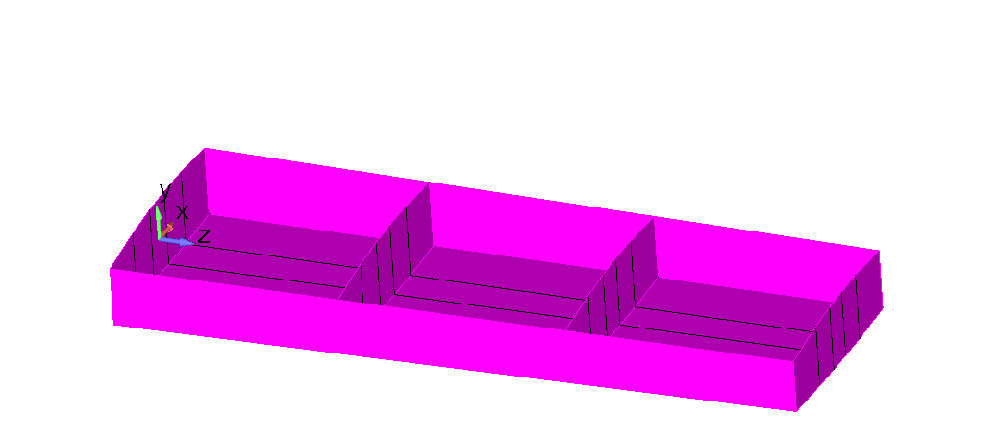

## Загрузка результатов расчета

В результате расчета КЭМ сгенерированны три файла данных:
* `prop` - данные характеристик модели
* `geom_param` - геометрия модели
* `results_solve` - результаты расчета

#### Константы раздела

In [5]:
#название исходных данных
name_prop = "all_prop.xlsx"
name_geom_param = "geom_param.xlsx"
name_solve = "all_solve.xlsx"

#название директории с исходными данными
name_folder = 'data'

#### Функции раздела

In [6]:
#функция чтения исходных данных
#name_data - название файла 
#name_folder - название папки

def read_initial_data(name_data, name_folder):
    
    #корень проекта
    current_dir = os.getcwd()
    project_root = os.path.dirname(current_dir)
    
    data_path = os.path.join(project_root, name_folder, name_data)
    data_path_folder = os.path.join(project_root, name_folder)
    

    #проверка существования файла
    if os.path.exists(data_path):
        df = pd.read_excel(data_path)
        print(f'Файл {name_data} прочитан')
    else:
        print(f"Файл {name_data} не найден")
        
        #вывод содержания директории
        print(f'Содержимое {name_folder}/ : {os.listdir(data_path_folder)}')
    return df

### Импорт исходных данных

In [7]:
prop = read_initial_data(name_prop, name_folder) #данные характеристик модели
geom_param = read_initial_data(name_geom_param, name_folder) #геометрия модели
results_solve = read_initial_data(name_solve, name_folder) #результаты расчета

Файл all_prop.xlsx прочитан
Файл geom_param.xlsx прочитан
Файл all_solve.xlsx прочитан


### Характеристики FEM модели - `prop`

In [8]:
#вывод первых 5 строк данных
prop.head()

,id_solve,skin_top,skin_bot,long_front,long_back,m
0,1,0.8,0.8,0.8,0.8,0.005833
1,2,0.8,0.9,0.8,0.8,0.005963
2,3,0.8,1.0,0.8,0.8,0.006092
3,4,0.8,1.2,0.8,0.8,0.006352
4,5,0.8,1.5,0.8,0.8,0.006740


In [9]:
#общая информация
prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_solve    10000 non-null  int64  
 1   skin_top    10000 non-null  float64
 2   skin_bot    10000 non-null  float64
 3   long_front  10000 non-null  float64
 4   long_back   10000 non-null  float64
 5   m           10000 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 468.9 KB


Файл **`fem_characteristics.xlsx`** ИД успешно прочитан.

Первичный анализ датафрейма `prop`:

* Датафрейм содержит: 6 столбцов и 10000 строк  
* В датафрейме нет пропущенных значений *Nan*  
* Названия столбцов соответствуют единому стилю
* Типы данных в столбцах *float64*, *int64*

Описание данных:
* *id_solve* - номер расчета
* *skin_top* - толщины верхней обшивки кессона $\delta_{skin top}, мм$
* *skin_bot* - толщины нижней обшивки кессона $\delta_{skin bot}, мм$
* *long_front* - толщины стенки переднего лонжерона $\delta_{long front}, мм$
* *long_back* - толщины стенки заднего лонжерона $\delta_{long back}, мм$*
* *m* - масса конструкции с заданными параметрами *(т)*


**Предобработка данных не требуется.**




### Описание геометрии FEM модели - `geom_param`

In [10]:
#вывод данных
geom_param

,ID,Def CSys,Active Csys,X-Act,Y-Act,Z-Act
0,4,0,3..Rectangular Coordinate System,0.000000e+00,0.000000e+00,0.0000
1,3,0,3..Rectangular Coordinate System,-2.598910e-04,-5.879700e-03,399.9600
2,2,0,3..Rectangular Coordinate System,5.247010e-05,-6.511420e-03,800.0202
3,1,0,3..Rectangular Coordinate System,-2.637091e-10,-1.970290e-09,1199.9850


In [11]:
#общая информация
geom_param.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ID           4 non-null      int64  
 1   Def CSys     4 non-null      int64  
 2   Active Csys  4 non-null      object 
 3   X-Act        4 non-null      float64
 4   Y-Act        4 non-null      float64
 5   Z-Act        4 non-null      float64
dtypes: float64(3), int64(2), object(1)
memory usage: 324.0+ bytes


Файл **`geom_param.xlsx`** ИД успешно прочитан.

Первичный анализ датафрейма `geom_param`:

* Датафрейм содержит: 6 столбцов и 4 строки
* В датафрейме нет пропущенных значений *Nan*  
* Названия столбцов не соответствуют единому стилю
* Типы данных в столбцах *float64*, *int64*, *object*

Описание данных:
* *ID* - номер узла вывода результатов.
* *Def CSys* - номер глобальной системы координат
* *Active Csys* - номер локальной системы координат (ЛСК), в которой выведены результаты расчета и приложена нагрузка
* *X-Act*, *Y-Act*, *Z-Act* - координаты узлов в ЛСК *(мм)*

Требуется предобработка данных.
1. удалить неинформативные столбцы *Def CSys*, *Active Csys*, *X-Act* и *Y-Act*
2. переименовать столбцы *ID* и *Z-Act*

### Результаты расчета - `results_solve`

In [12]:
#вывод первых 10 строк данных
results_solve.head(10)

,Results Set ID,Nodes,R1 Rotation (CSys 3)
0,1,1,-0.000053
1,1,2,-0.000029
2,1,3,-0.000016
3,1,4,0.000000
4,2,1,-0.000051
5,2,2,-0.000028
6,2,3,-0.000015
7,2,4,0.000000
8,3,1,-0.000050
9,3,2,-0.000027


In [13]:
#общая информация
results_solve.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Results Set ID        40000 non-null  int64  
 1   Nodes                 40000 non-null  int64  
 2   R1 Rotation (CSys 3)  40000 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 937.6 KB


Файл **`all_solve.xlsx`** ИД успешно прочитан.

Первичный анализ датафрейма:

* Датафрейы содержет: 3 столбца и 40000 строк  
* В датафрейме нет пропущенных значений *Nan*  
* Названия столбцов не соответствуют единому стилю
* Типы данных в столбцах *float64*, *int64*

Описание данных:
* *Results Set ID* - номер расчета
* *Nodes* - номер узла вывода результатов
* *R1 Rotation (CSys 3)* - угол поворота вокруг оси Х ЛСК *(рад)*

Требуется предобработка данных - переименование столбцов.

## Вывод

Исходные данные для создания метамодели и оптимизатора загружены корректно.

# Предварительная обработка данных

В ходе загрузки результатов расчета и описания геометрии кессона датафреймам : `geom_param`, `results_solve` требуется предобработка.

## Описание геометрии FEM модели - `geom_param`

Этапы предобработки датайрейма `geom_param`:
1. удаление неинформативных столбцов *Def CSys*, *Active Csys*, *X-Act* и *Y-Act*
2. переименование столбцов *ID* и *Z-Act*

In [14]:
#удаление неинформативных столбцов
geom_param = geom_param.drop(columns=[
    'Def CSys',
    'Active Csys',
    'X-Act',
    'Y-Act'
])

#переименование столбцов
geom_param = geom_param.rename(columns={
    'ID' : 'node',
    'Z-Act' : 'z_coord'
})

#проверка внесенных изменений
geom_param            

,node,z_coord
0,4,0.0000
1,3,399.9600
2,2,800.0202
3,1,1199.9850


Датафрейм **`geom_param`** преобразован для дальнейшей работы.

## Результаты расчета - `results_solve`

In [15]:
#переименование столбцов
new_name_columns = {
    'Results Set ID' : 'id_solve',
    'Nodes' : 'node',
    'R1 Rotation (CSys 3)' : 'rotation'
}

results_solve = results_solve.rename(columns=new_name_columns)

#проверка, вывод первых 8 строк
results_solve.head(8)

,id_solve,node,rotation
0,1,1,-0.000053
1,1,2,-0.000029
2,1,3,-0.000016
3,1,4,0.000000
4,2,1,-0.000051
5,2,2,-0.000028
6,2,3,-0.000015
7,2,4,0.000000


Столбцы датафрейма переименовались корректно.

Описание данных:
* *id_solve* - номер расчета
* *node* - номер узла вывода результатов
* *rotation* - угол поворота вокруг оси Х ЛСК *(рад)*.

## Расчет погонных жесткостей

Изгибная жесткость $EJ_{xi}$ секции вычисляется по формуле
$$EJ_{xi} = \frac{M_x  \cdot \Delta l_i }{\Delta \phi_i},$$

где ${M_x} = 10000 $ *(Нмм)* - приложенный момент. Постоянный для всех расчетов.  
${\Delta l_i}$ *(мм)* - длина *i* секции (расстояние между нервюрами). Вычисляется из данных датафрейма **`geom_param`**.   
${\Delta \phi_i}$ *(рад)* - угол поворота *i* секции. Вычисляется из данных датафрейма **`results_solve`**.


**Секция** - часть конструкции между нервюрами. Нумерация секций в моделе:

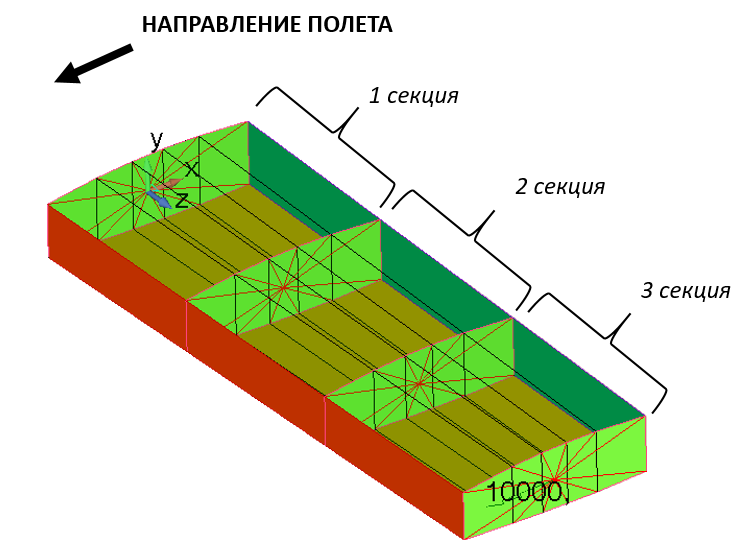

Суммарная жесткость конструкции $EJ_{x}$ равна
$$EJ_{x} = \sum{EJ_{xi}}.$$

#### Константы раздела

In [16]:
#приложенный момент
moment = -10000

#### Функции раздела

In [17]:
#создание датафрейма с жесткостями секций
#group_result - сгруппированные значения результатов

def process_all_groups(group_result):
    results = []
    
    for id_solve, group_df in group_result:
        
        df = group_df.sort_values('node', ascending=False)
        
        df['delta_rotation'] = df['rotation'].diff().fillna(0)
        
        
        df = df.merge(
            geom_param[['delta_l', 'node']],
            on='node',
            how='left'
        )

        df['stiffnes'] = moment * df['delta_l'] / df['delta_rotation']
        
        total_stiffness = df['stiffnes'].sum()

        results.append(
            {'id_solve': id_solve,
            'stiffness': total_stiffness}
        )

    return pd.DataFrame(results)

### Вычисления

In [18]:
#вычисление длины секции
geom_param['delta_l'] = geom_param['z_coord'].diff().fillna(0)

#проверка
geom_param

,node,z_coord,delta_l
0,4,0.0000,0.0000
1,3,399.9600,399.9600
2,2,800.0202,400.0602
3,1,1199.9850,399.9648


In [19]:
#группировка результатов по номерам расчетов (id_solve)
group_result = results_solve.groupby(by='id_solve')

#проверка количества групп
print("Число групп :", group_result.ngroups)

Число групп : 10000


In [20]:
#расчет жесткостей
df_stiffnes = process_all_groups(group_result)

#проверка первых 5 строк
df_stiffnes.head()

,id_solve,stiffness
0,1,7.183719e+11
1,2,7.437421e+11
2,3,7.674308e+11
3,4,8.104843e+11
4,5,8.662751e+11


In [21]:
#объединение результатов в один датафрейм
prop = prop.merge(df_stiffnes, 
                  how='right',
                  on='id_solve'
                 )
#проверка объединения
prop.head()

,id_solve,skin_top,skin_bot,long_front,long_back,m,stiffness
0,1,0.8,0.8,0.8,0.8,0.005833,7.183719e+11
1,2,0.8,0.9,0.8,0.8,0.005963,7.437421e+11
2,3,0.8,1.0,0.8,0.8,0.006092,7.674308e+11
3,4,0.8,1.2,0.8,0.8,0.006352,8.104843e+11
4,5,0.8,1.5,0.8,0.8,0.006740,8.662751e+11


In [22]:
#вывод общей информации
prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_solve    10000 non-null  int64  
 1   skin_top    10000 non-null  float64
 2   skin_bot    10000 non-null  float64
 3   long_front  10000 non-null  float64
 4   long_back   10000 non-null  float64
 5   m           10000 non-null  float64
 6   stiffness   10000 non-null  float64
dtypes: float64(6), int64(1)
memory usage: 547.0 KB


Результаты расчета жесткостей добавлены в датафрейм **`prop`**. 

Обновленный датафрейм **`prop`**
* содержит: 7 столбцов и 10000 строк  
* В датафрейме нет пропущенных значений *Nan*  
* Названия столбцов соответствуют единому стилю
* Типы данных в столбцах *float64*, *int64*


## Вывод

Загруженные данные обработаны и приведены в один датафрейм - `prop`.   
Столбцы : **skin_top**, **skin_bot**, **long_front**, **long_back** - ***входные*** признаки.   
Столбцы : **m** и **stiffness** - ***целевые***  признаки.

# Анализ исходных данных

В данном разделе проверяется:
1. корреляция признаков
2. характер зависимостей входящих и целевых признаков.

## Корреляция признаков

Корреляция признаков визуализируется с помощью матрицы корреляции **phi_K** и матрицы рассеяния.

In [23]:
#создание копии датайрейма prop
data = prop.copy()

#проверка создания
data.head()

,id_solve,skin_top,skin_bot,long_front,long_back,m,stiffness
0,1,0.8,0.8,0.8,0.8,0.005833,7.183719e+11
1,2,0.8,0.9,0.8,0.8,0.005963,7.437421e+11
2,3,0.8,1.0,0.8,0.8,0.006092,7.674308e+11
3,4,0.8,1.2,0.8,0.8,0.006352,8.104843e+11
4,5,0.8,1.5,0.8,0.8,0.006740,8.662751e+11


In [24]:
#удаление из data неинформативного столбца
data = data.drop(columns='id_solve')

#проверка удаления
data.head()

,skin_top,skin_bot,long_front,long_back,m,stiffness
0,0.8,0.8,0.8,0.8,0.005833,7.183719e+11
1,0.8,0.9,0.8,0.8,0.005963,7.437421e+11
2,0.8,1.0,0.8,0.8,0.006092,7.674308e+11
3,0.8,1.2,0.8,0.8,0.006352,8.104843e+11
4,0.8,1.5,0.8,0.8,0.006740,8.662751e+11


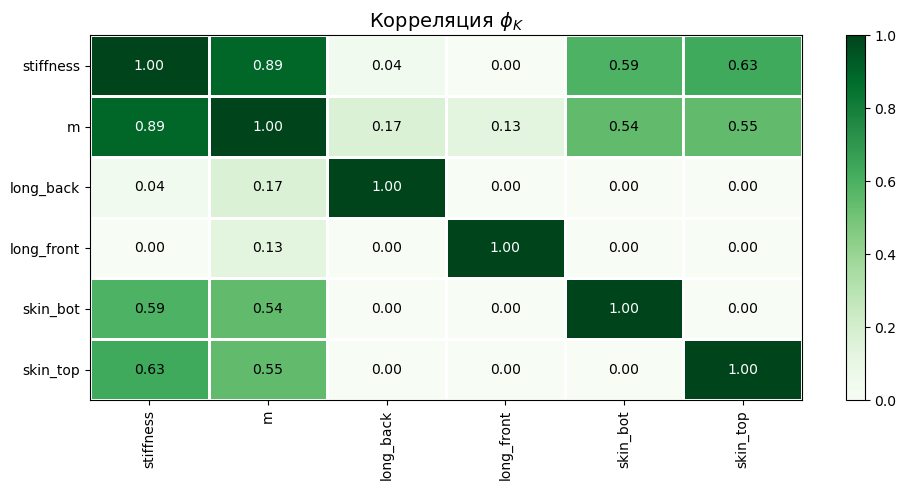

In [25]:
#создание корреляционной матрицы
phik_overview = phik_matrix(
    data,
    interval_cols=data.columns.values
)

#визуализация корреляционной матрицы
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'Корреляция $\phi_K$',    
    figsize=(10, 5)
) 

In [26]:
#матрица рассеяния
fig = px.scatter_matrix(data)

fig.update_layout(
    title='Матрица рассеяния признаков',
    width=1200, height=1000,
    title_x=0.5
)

fig.show()

По матрицам корреляции и рассеяния видно, что:
* наибольшая корреляция между двумя целевыми признаками - жесткостью и массой. Это объясняется физикой процесса : чем больше масса конструкции, тем ее перемещения от нагрузки меньше (конструкция жестче).
* ненулевой коэффициент корреляции между жесткостью и обшивками объясняется работой конструкции: рассматриваемая конструкция кессона по типу является полумонококовой - изгиб воспринимается поясами лонжеронов (не участвуют в оптимизации) и обшивками. 
* мультиколлинеарность между ***входными*** и ***целевыми*** признаками необнаружена.

## Характер зависимостей входящих и целевых признаков

Для анализа влияния изолированного изменения **входящих** признаков 
(например, толщины верхней обшивки) при фиксированных значениях остальных 
параметров силовой конструкции на **целевые** переменные требуется 
построение серии зависимостей. Это позволит визуально оценить чувствительность к вариации отдельного фактора (толщины) при постоянных условиях.

#### Функции раздела

In [27]:
#функция визуализации зависимостей
#df - датафрейм
#column_1, column_2, column_3 - зафиксированные признаки
#target - исследуемый признак

def line_plot(df, column_1, column_2, column_3, target):
    
    fig = make_subplots(
        rows=len(delta_lista), cols=2,
        shared_yaxes=False,
        horizontal_spacing=0.2,
            subplot_titles=(f'Влияние {target} на жесткость (EI)',
                            f'Влияние {target} на массу (m)')
        )

    for delta, i in zip(delta_lista, range(1, len(delta_lista) + 1)):
        mask = (df[column_1] == delta) & (df[column_2] == delta) & (df[column_3] == delta)
        result = df.loc[mask]
        

        fig.add_trace(
            go.Scatter(
                x=result[target],
                y=result['stiffness'],
                
            name=f'{delta}, мм'
        ),
        row=i, col=1
    )
        
        fig.add_trace(
            go.Scatter(
                x=result[target],
                y=result['m'], 
            name=f'{delta}, мм'
        ),
        row=i, col=2
        )

            #обновление layout
        fig.update_layout(
            height=1500, 
            width=800,
            title_x=0.5, 
            showlegend=False,
            title_text=f"Характер влияния входящего признака {target} на целевые признаки"
        )

        
        fig.update_xaxes(title_text=f'{target}, мм', row=i, col=1)
        fig.update_xaxes(title_text=f'{target}, мм', row=i, col=2)
        fig.update_yaxes(title_text='EI, Нмм²/рад', row=i, col=1)
        fig.update_yaxes(title_text='m, т', row=i, col=2)

    
    return fig
    

### Влияние верхней обшивки на целевые признаки

In [28]:
#влияние верхней обшивки на целевые признаки
fig = line_plot(
    data,
    column_1='skin_bot',
    column_2='long_front',
    column_3='long_back',
    target='skin_top'
)

fig.show()

Анализ влияния толщины верхней обшивки *skin_top* показал:
1. при толщинах сопряженных силовых элементов менее 2 *(мм)* наблюдается линейная 
  зависимость, как для жесткости, так и для массы;
2. при толщинах сопряженных элементов 2,5 *(мм)* зависимость массы сохраняет 
  линейный характер, а жесткость демонстрирует нелинейное поведение относительно изменения толщины верхней обшивки.

### Влияние нижней обшивки на целевые признаки

In [29]:
#влияние нижней обшивки на целевые признаки
fig = line_plot(
    data,
    column_1='skin_top',
    column_2='long_front',
    column_3='long_back',
    target='skin_bot'
)

fig.show()

Анализ влияния толщины нижней обшивки *skin_bot* показал:
1. при толщинах сопряженных силовых элементов равных 0,8 *(мм)* наблюдается линейная 
  зависимость, как для жесткости, так и для массы;
2. при толщинах сопряженных элементов более 0,9 *(мм)* зависимость массы сохраняет 
  линейный характер, а жесткость демонстрирует нелинейное поведение относительно изменения толщины нижней обшивки.

### Влияние переднего лонжерона на целевые признаки

In [30]:
#влияние переднего лонжерона на целевые признаки
fig = line_plot(
    data,
    column_1='skin_top',
    column_2='skin_bot',
    column_3='long_back',
    target='long_front'
)

fig.show()

Анализ влияния толщины стенки переднего лонжерона *long_front* показал:
1. при толщинах сопряженных силовых элементов в диапазоне 0,9 - 2 *(мм)* наблюдается линейная зависимость,
  как для жесткости, так и для массы. 
2. жесткость демонстрирует нелинейное поведение относительно изменения толщины стенки переднего лонжерона для толщин стенок 0,8 и 2,5 *(мм)*.

### Влияние заднего лонжерона на целевые признаки

In [31]:
#влияние заднего лонжерона на целевые признаки
fig = line_plot(
    data,
    column_1='skin_top',
    column_2='skin_bot',
    column_3='long_front',
    target='long_back'
)

fig.show()

Анализ влияния толщины стенки заднего лонжерона *long_back* показал:
1. при толщинах сопряженных силовых элементов в диапазоне 0,9 - 2 *(мм)* наблюдается линейная зависимость,
  как для жесткости, так и для массы. 
2. жесткость демонстрирует нелинейное поведение относительно изменения толщины стенки заднего лонжерона для толщин стенок 0,8 и 2,5 *(мм)*.

## Выводы

Проведенный анализ исходных данных показал:
1. отсутсвие мультиколлинеарности между **входящими** и **целевыми** признаками
2. линейные зависимости между всеми **входящими** признаками и **целевым** признаком - массой конструкции
3. наличие нелинейных зависисмостей между всеми **входящими** признаками и **целевым** признаком - погонная жесткость конструкции.

# Создание метамодели

Для оптимизации необходимо создать метамодель кессона. Это осуществляется с помощью создания нейронной сети принимающей на вход толщины силовых элементов и предсказывающая массу и жесткость конструкции.

#### Константы раздела

In [32]:
RANDOM_STATE = 40

## Разделение данных на выборки

Разделение признаков на **входящие** и **целевые**.

In [33]:
#входящие признаки
X = data.drop(
    columns=['stiffness', 'm']).values

#целевые признаки
y = data[['m', 'stiffness']].values

Разделение на обучающую и тестовую выборки

In [34]:
#разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    random_state=RANDOM_STATE)

Проверка размерности получившихся выборок

In [35]:
#Проверка размерностей входных признаков
for i, df in zip(['исходного датасета', 
                 'тренировочных',
                 'тестовых'], [X, X_train, X_test]):
    print(f'Размерность {i} входных признаков: \n строк = {df.shape[0]}, \n столбцов = {df.shape[1]}')

Размерность исходного датасета входных признаков: 
 строк = 10000, 
 столбцов = 4
Размерность тренировочных входных признаков: 
 строк = 7500, 
 столбцов = 4
Размерность тестовых входных признаков: 
 строк = 2500, 
 столбцов = 4


In [36]:
#Проверка размерностей целевых признаков
for i, df in zip(['исходного датасета', 
                 'тренировочных',
                 'тестовых'], [y, y_train, y_test]):
    print(f'Размерность {i} целевых признаков: \n строк = {df.shape[0]}, \n столбцов = {df.shape[1]}')

Размерность исходного датасета целевых признаков: 
 строк = 10000, 
 столбцов = 2
Размерность тренировочных целевых признаков: 
 строк = 7500, 
 столбцов = 2
Размерность тестовых целевых признаков: 
 строк = 2500, 
 столбцов = 2


Данные разделены на **обучающие** и **тестовые** выборки корректно.

## Создание класса - обертки

Для интеграции модели в веб-платформу, обеспечения 
функциональности обучения и тестирования разработан класс-обертка.

Данный класс реализует унифицированный интерфейс для:
- предобработки данных (масштабирование)
- выполнения прогнозирования с использованием обученной модели
- тестирование входных параметров
- сохранение и загрузка обученной сети

In [37]:
#Обертка для всей сети
#включает в себя всю логику:
#масштабирование, обучение, предсказание, оценку
#сохранение сети

class kesson_model:
 
#Инициализация конвейера
    def __init__(
        self,
        input_size=None, #число входных нейронов
        output_size=2, #число выходных нейронов
        neural_layer_1=64, #число нейронов в первом слое
        neural_layer_2=32, #число нейронов во втором слое
        dropout_1=0.05,
        dropout_2=0.05, #дропаут для второго слоя
        epochs=200, #число эпох обучения
        lr=0.001, #скорость обучения
        weight_decay=1e-5, #параметр L2 регуляризации
        
        batch_size=64, #число батчей
        random_state=RANDOM_STATE #константа фиксирующая воспроизводимость
        
    ):  

        #фиксация случайностей
        self.seed = random_state
        random.seed(random_state) 
        np.random.seed(random_state)
        torch.manual_seed(random_state) 

        self.model = None
        self.scaler_X = StandardScaler()
        self.scaler_y = StandardScaler()
        self.neural_layer_1 = neural_layer_1
        self.neural_layer_2 = neural_layer_2
        self.dropout1 = dropout_1  
        self.dropout2 = dropout_2  
        self.input_size = input_size
        self.output_size = output_size
        self.epochs = epochs
        self.lr = lr
        self.weight_decay = weight_decay
        self.batch_size = batch_size
       
        
        self.criterion = nn.MSELoss() # функция ошибки
        self.train_losses = [] # хранение истории

#Функция масштабирования train
#X_train - входные призаки в исходном масштабе
#y_train - целевые признаки в исходном масштабе
    def scaling(self, X_train, y_train):
        X_train_scaled = self.scaler_X.fit_transform(X_train)
        y_train_scaled = self.scaler_y.fit_transform(y_train)

        return X_train_scaled, y_train_scaled

#Конвертация данных в тензоры
#data - масштабированные данные
#requires_grad - нужны ли градиенты (False для предсказания)
    
    def convert_tensor(self, data, requires_grad=False):    
        return torch.tensor(data, dtype=torch.float32, requires_grad=requires_grad)

#Архитектура нейронной сети
    class KessonNN(nn.Module):
        def __init__(
            self, input_size, neural_layer_1, neural_layer_2,
            dropout1, dropout2
        ):
            super().__init__()
            self.shared_net = nn.Sequential(
                nn.Linear(input_size, neural_layer_1),
                nn.ReLU(),
                nn.Dropout(dropout1),
                nn.Linear(neural_layer_1, neural_layer_2),
                nn.Hardtanh(),
                nn.Dropout(dropout2)
            )
            self.mass_head = nn.Linear(neural_layer_2, 1)
            self.stiffness_head = nn.Linear(neural_layer_2, 1)

        def forward(self, x):
            x = self.shared_net(x)
            mass = self.mass_head(x)
            stiffness = self.stiffness_head(x)
            return torch.cat((mass, stiffness), dim=1)

#Обучение модели
#X_train - немасштабированные входные признаки (np)
#y_train - немасштабированные целевые признаки (np)
    
    def fit(self, X_train, y_train):

        #определение числа нейронов во входном слое
        self.input_size = X_train.shape[1]
 
        #масштабирование тренировочных признаков
        X_train_scaled, y_train_scaled = self.scaling(X_train, y_train)

        #конвертация тренировочных признаков в тензоры
        X_train_tensor = self.convert_tensor(X_train_scaled,
                                               requires_grad=True)
        y_train_tensor = self.convert_tensor(y_train_scaled,
                                               requires_grad=True)        

        #создание TensorDataset
        train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
        #создание DataLoader
        train_loader = DataLoader(train_dataset, self.batch_size, shuffle=True)
            
        #создание сети
        self.model = self.KessonNN(
            self.input_size,
            self.neural_layer_1,
            self.neural_layer_2,
            self.dropout1,
            self.dropout2
        )

        optimizer = torch.optim.Adam(
            self.model.parameters(),
            lr=self.lr,
            weight_decay=self.weight_decay
        )
     
        #сброс истории перед новым обучением
        self.train_losses = []


        for i_epoch in range(1, self.epochs + 1):
            self.model.train()
            running_loss = 0.0

            for batch_X, batch_y in train_loader:
                optimizer.zero_grad()
                outputs = self.model(batch_X)
                loss = self.criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()

            epoch_loss = running_loss / len(train_loader)
            self.train_losses.append(epoch_loss) #loss для истории
            
            if (i_epoch) % 20 == 0:
                print(f'Epoch [{i_epoch}/{self.epochs}], Loss: {epoch_loss:.6f}')


        #возвращение self для цепочки вызовов
        return self


#Предсказания
#X - входные признаки в исходном масштабе (np)

#predictions_scaling - вывод предсказаний в исходном или в масштабе
   
    def predict(self, X, predictions_scaling=False):
        
        #масштабирование входных признаков
        X_scaled = self.scaler_X.transform(X)
         
        #конвертация входных признаков в тензор
        X_tensor = self.convert_tensor(X_scaled)

        #перевод в режим оценки
        self.model.eval()

        #предсказание
        with torch.no_grad():
            predictions = self.model(X_tensor)

        if predictions_scaling:
            #перевод предсказаний в исходный масштаб
            pred = self.scaler_y.inverse_transform(predictions.numpy())
        else:
            pred = predictions

        return pred
 
    def predict_with_grad(self, X_tensor):

        predictions = self.model(X_tensor)
        return predictions  

    
#Оценка предсказаний
#pred - предсказания в исходный масштабе
    
    def score(self, pred, y):

        self.model.eval()

        #масштабирование целевых признаков валидационных данных
        y_scaled = self.scaler_y.transform(y)
        y_tensor = self.convert_tensor(y_scaled)

        #масштабирование предсказаний
        pred_scaled = self.scaler_y.transform(pred)
        pred_tensor = self.convert_tensor(pred_scaled)

        test_loss = self.criterion(pred_tensor, y_tensor).item()
            
        r2_mass = r2_score(y[:, 0], pred[:, 0])
        r2_stiffness = r2_score(y[:, 1], pred[:, 1])

        print(f"MSE = {test_loss:.4f}")
        print(f"R2 масса = {r2_mass:.4f}")
        print(f"R2 жесткость = {r2_stiffness:.4f}")

        return {'loss' : test_loss,
                'r2_mass' : r2_mass,
                'r2_stiffness' : r2_stiffness}

#Функция вызова параметров
    def parameters(self):         
        return self.model.parameters()

#Функция перевода в режим предсказания    
    def eval(self):
        self.model.eval() 
        return self 

#Функция перевода режим обучения   
    def train(self, mode=True):        
        self.model.train(mode)
        return self
    
#Сохранение модели и скейлеров
#filepath - путь
    
    def save(self, filepath):
        
        if self.model is None:
            raise ValueError("Нет обученной модели для сохранения.")
        
        #сохранение весов модели
        torch.save(self.model.state_dict(), f'{filepath}_model_weights.pth')
        
        #сохранение скейлеров и параметров
        save_dict = {
            'scaler_X': self.scaler_X,
            'scaler_y': self.scaler_y,
            'input_size': self.input_size,
            'neural_layer_1': self.neural_layer_1,
            'neural_layer_2': self.neural_layer_2,
            'dropout1': self.dropout1,
            'dropout2': self.dropout2
        }
        joblib.dump(save_dict, f'{filepath}_model_config.joblib')
        
        print(f"Модель сохранена: {filepath}_model_weights.pth и {filepath}_model_config.joblib")
        
#Загрузка модели и скейлеров
#filepath - путь

    def load(self, filepath):
        
        #загрузка конфигураци
        config = joblib.load(f'{filepath}_model_config.joblib')
        
        #восстановление параметров
        self.scaler_X = config['scaler_X']
        self.scaler_y = config['scaler_y']
        self.input_size = config['input_size']
        self.neural_layer_1 = config['neural_layer_1']
        self.neural_layer_2 = config['neural_layer_2']
        self.dropout1 = config['dropout1']
        self.dropout2 = config['dropout2']
        
        #создание и загрузка модели
        self.model = self.KessonNN(
            self.input_size, 
            self.neural_layer_1, 
            self.neural_layer_2, 
            self.dropout1, 
            self.dropout2
        )
        self.model.load_state_dict(torch.load(f'{filepath}_model_weights.pth'))
        self.model.eval()
        
        print(f"Модель загружена: {filepath}")
        return self    


In [38]:
#создание сети
model = kesson_model()

## Стандартизация значений

Признаки имеют разный масштаб данных:
* толщины : $10^{-1}$ *(мм)*
* массы : $10^{-3}$ *(т)*
* жесткости : $10^{+12}$ *(Нмм²/рад)*.

Различие в порядках между минимальными и максимальными значениями требует применения масштабирования для приведения признаков к сопоставимым диапазонам значений.

#### Функции раздела

In [39]:
#функция боксплотов для визуализации масштабирования данных
#data_original - оригинальный масштаб данных
#data_scaling - стандартизированные значения
#name_data - название данных

def box_scaling(data_original, data_scaling, name_data):
    
    fig = make_subplots(
        rows=1, cols=2, 
        shared_yaxes=False,
        horizontal_spacing=0.2,
        subplot_titles=('До стандартизации', 'После стандартизации')
    )
    
    #первый график - оригинальные данные
    fig.add_trace(
        go.Box(
            y=data_original, 
            name='Оригинал'
        ),
        row=1, col=1
    )

    #второй график - стандартизированные данные
    fig.add_trace(
        go.Box(
            y=data_scaling, 
            name='Стандартизированный',
            marker_color='green'
        ),
        row=1, col=2
    )

    #настройка осей
    if data_original[0] < 0.01:
        tickformat = ".3f"
    else:
        tickformat = None
    
    fig.update_yaxes(
        row=1, col=1,
        tickformat=tickformat
    )
    
    fig.update_yaxes(        
        row=1, col=2,
        tickformat=".2f"        
    )

    #обновление layout
    fig.update_layout(
        height=500, 
        width=800,
        title_x=0.5, 
        showlegend=False,
        title_text=f"Сравнение данных: {name_data}"
    )
    
    return fig

### Масштабирование тренировочных данных

В класс-обертку встроен блок стандартизации, перед началом обучения сети проверяется корректность работы стандартизатора путем визуализации признаков до и после масштабирования.

Для удобстава визуализации создаются словари, хранящие оригинальные и масштабированные значения.

In [40]:
#словарь для проверки масштабирования входных признаков
input_atributs = {
    'skin_top' : [None, None, 'skin_top, мм'],
    'skin_bot' : [None, None, 'skin_bot, мм'],
    'long_front' : [None, None, 'long_front, мм'],
    'long_back' : [None, None, 'long_back, мм']
}
#словарь для проверки масштабирования целевых признаков
target_atributs = {
    'mass' : [None, None, 'm, т'],
    'stiffness' : [None, None, 'EI, Нмм²/рад']
}

In [41]:
#стандартизация тренировочных данных
X_train_scaled, y_train_scaled = model.scaling(
    X_train, y_train)

In [42]:
#заполнение словарей

#словарь входных признаков
for key, i in zip(input_atributs.keys(), range(4)):
    input_atributs[key][0] = X_train[:, i]
    input_atributs[key][1] = X_train_scaled[:, i]

#словарь целевых признаков
for key, i in zip(target_atributs.keys(), range(2)):
    target_atributs[key][0] = y_train[:, i]
    target_atributs[key][1] = y_train_scaled[:, i]

#### Проверка масштабирования входных признаков

In [43]:
#визуализация входных признаков тренировочных данных
for key in input_atributs.keys():
    fig = box_scaling(
        input_atributs[key][0],
        input_atributs[key][1],
        input_atributs[key][2]
    )
    fig.show()

#### Проверка масштабирования целевых признаков

In [44]:
#визуализация целевых признаков тренировочных данных
for key in target_atributs.keys():
    fig = box_scaling(
        target_atributs[key][0],
        target_atributs[key][1],
        target_atributs[key][2]
    )
    fig.show()

**Тренировочные данные масштабируются корректно.**

### Масштабирование тестовых данных

Проверка масштабирования тестовых данных.

In [45]:
#стандартизация тестовых данных
X_test_scaled = model.scaler_X.transform(X_test)
y_test_scaled = model.scaler_y.transform(y_test)

In [46]:
#заполнение словарей
#словарь входных признаков
for key, i in zip(input_atributs.keys(), range(4)):
    input_atributs[key][0] = X_test[:, i]
    input_atributs[key][1] = X_test_scaled[:, i]

#словарь целевых признаков
for key, i in zip(target_atributs.keys(), range(2)):
    target_atributs[key][0] = y_test[:, i]
    target_atributs[key][1] = y_test_scaled[:, i]

#### Проверка масштабирования входных признаков

In [47]:
#визуализация входных признаков тестовых данных
for key in input_atributs.keys():
    fig = box_scaling(
        input_atributs[key][0],
        input_atributs[key][1],
        input_atributs[key][2]
    )
    fig.show()

#### Проверка масштабирования целевых признаков

In [48]:
#визуализация целевых признаков тестовых данных
for key in target_atributs.keys():
    fig = box_scaling(
        target_atributs[key][0],
        target_atributs[key][1],
        target_atributs[key][2]
    )
    fig.show()

**Тестовые данные стандартизируются корректно.**

## Обучение сети

In [49]:
#обучение сети
model.fit(X_train, y_train)

Epoch [20/200], Loss: 0.024781
Epoch [40/200], Loss: 0.018015
Epoch [60/200], Loss: 0.015669
Epoch [80/200], Loss: 0.014050
Epoch [100/200], Loss: 0.012718
Epoch [120/200], Loss: 0.012753
Epoch [140/200], Loss: 0.013055
Epoch [160/200], Loss: 0.012262
Epoch [180/200], Loss: 0.012284
Epoch [200/200], Loss: 0.012037


Сеть обучена за 200 эпох с размером батча 64:
* начальный уровень ошибки: 0.0248
* финальный уровень ошибки: 0.012 

Описание архитектуры:

Тип сети - **Полносвязный**

1. Первый слой:  5 нейронов (4 - **входные** признаки, 1 - смещение)
2. Второй слой: 64 нейрона (скрытый слой)  
   *  функция активации *ReLU*
   *  прореживание *Dropuot* с вероятностью 0.05    
3. Третий слой: 32 нейрона (скрытый слой)
   * функция активации *Hardtanh*
   * прореживание *Dropuot* с вероятностью 0.05
4. Выходной слой: 2 нейрона (1 - прогноз массы, 1 - прогноз жесткости)


Особенности архитектуры:
* оптимизатор - алгоритм *Adam*
* ограничения переобучения:
    1. параметр алгорима *Adam* (L2 реругялизация : weight_decay)
    2. прореживание *Dropuot*
* функция ошибки - *MSE*


## Проверка сети на тестовых данных

#### Функции раздела

In [50]:
#функция визцализации предсказаний и истинных значений
#y_test - истинные значения
#y_pred - предсказанные значения
#title - добавление к названию

def charts_residuals_plotly(y_test, y_pred, title=None):
    
    df = pd.DataFrame({
        'y_true' : y_test,
        'y_pred' : y_pred
    })

    df['residuals'] = df['y_true'] - df['y_pred']

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=df['y_true'],
            y=df['y_pred'],
            mode='markers',
            name='Предсказания'
        )
    )

    min_val = min(df['y_true'].min(), df['y_pred'].min())
    max_val = max(df['y_true'].max(), df['y_pred'].max())
    
    fig.add_trace(
        go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            line=dict(dash='dash', color='black'),
            name='линия идеальных предсказаний'
        )
    )
        
   
    fig.update_layout(
        title=f'Сравнение предсказаний с истинными значениями: {title}',
        xaxis_title='Истинные значения',
        yaxis_title='Предсказанные значения',
        title_x=0.5,
        showlegend=True
    )

    return fig

### Оценка предсказаний

In [51]:
#предсказания на тестовых данных
predictions_test = model.predict(X_test, predictions_scaling=True)

#оценка предсказаний на тестовых данных
score_valid = model.score(
    pred=predictions_test,
    y=y_test
)

MSE = 0.0020
R2 масса = 0.9995
R2 жесткость = 0.9965


Результаты тестирования модели на тестовой выборке:
* среднеквадратическая ошибка: *MSE* = 0.002 
* коэффициент детерминации массы: *R²* = 0.9995
* коэффициент детерминации жесткости: *R²* = 0.9965

Для корректной оценки сети необходимо рассмотреть распределения остатков.

### Анализ предсказаний

In [52]:
#визуализация остатков предсказаний массы конструкции
fig = charts_residuals_plotly(
    y_test[:, 0],
    predictions_test[:, 0],
    title='масса, (т)'
)

fig.show()

По графику **Сравнение предсказаний с истинными значениями** наблюдается высокое совпадение предсказаний модели с реальными данными.    

Коэффициент детерминации *R²* = 0.9995 показывает, что сеть объясняет 99,95% дисперсии **целевой** переменной. Это прямое следствие наличия строгой линейной зависимости **целевого** признака (массы) от **входящих** признаков. Линейный характер этих зависимостей, представлен в пункте ***«Характер зависимостей входящих и целевых признаков»***.

In [53]:
#визуализация остатков предсказаний жесткости конструкци
fig = charts_residuals_plotly(
    y_test[:, 1],
    predictions_test[:, 1],
    title='жесткость, (Нмм²/рад)'
)

fig.show()

Анализ графика **Сравнение предсказаний с истинными значениями** подтверждает высокую точность модели: предсказанные значения демонстрируют тесную корреляцию с истинными данными.

Количественной оценкой данной точности является коэффициент детерминации *R²* = 0.9965, который указывает, что сеть объясняет 99,65% дисперсии **целевой** переменной.

## Вывод

В результате работы создана **метамодель кессона** - полносвязная нейронная сеть с тремя слоями.

# Создание оптимизатора

Для подбора толщин силовых элементов создается **оптимизатор** - нейронная сеть, в основе которой лежит метамодель с "замороженными" градиентами. Оптимизатор на вход принимает толщины силовых элементов и предсказывает массу и жесткость конструкции.   
Предсказанную массу сравнивает с заданной (утвержденной) $M_{target}$ и максимизирует жесткость $EJ$.

## Создание класса - обертки оптимизатора

Для определения оптимальных толщин силовых элементов конструкции разработан оптимизатор, решающий многокритериальную задачу:

1. Минимизация отклонения от целевой массы конструкции (**Заданная масса**)
2. Максимизация жесткости при заданных ограничениях
3. Учет технологических требований к дискретным значениям толщин.

Оптимизатор оформлен в виде класса для интеграции в веб-платформу.

In [54]:
#обертка оптимизатора
class optimizer_kesson_model:
    
#Инициализация конвейера
    def __init__(
        self,
        model,  #обученная сеть
        lr=0.01,  #скорость обучения оптимизатора
        num_iterations=1000,  #количество итераций оптимизации
        clamp_min=-2.5,  #минимальное значение для зажимания параметров
        delta_technol=delta_lista  # технологические ограничения толщин
    ):
        
        self.model = model
        self.lr = lr
        self.num_iterations = num_iterations
        self.clamp_min = clamp_min        
        self.delta_technol = np.array(delta_technol)


#вычисление функции потерь
#x - входные данные 
#M_target_scaled - заданная стандартизированная масса 
    
    def optim_function(self, x, M_target_scaled):
        if not x.requires_grad:
                   x = x.requires_grad_(True)
        
        #предсказания
        predictions = self.model.predict_with_grad(x)
        
        #масса и жесткость - стандартизированные
        mass_pred_scaled = predictions[0, 0]
        stiffness_pred_scaled = predictions[0, 1]
    
        #штраф за отклонение от заданной массы
        penalty = (mass_pred_scaled - M_target_scaled) ** 2
        
        #функция потерь оптимизатора
        total_loss = -stiffness_pred_scaled + penalty

        results_optim_function = {
            'total_loss' : total_loss,
            'stiffness_pred_scaled' : stiffness_pred_scaled,
            'mass_pred_scaled' : mass_pred_scaled
        }
    
        return results_optim_function

#округление технологическое в минимальную сторону
#value - значение, найденное оптимизатором
    
    def round_to_allowed(self, value):
        idx = np.argmin(np.abs(self.delta_technol - value))
        return self.delta_technol[idx]

#прочностная оптимизация
#x - входной вектор в исходном масштабе (вокруг которого ищется оптимальное значние)
#M_target_scaled - заданная масса в стандартизированном масштабе
    
    def stress_optimization(self, x, M_target_scaled):
        
        #преобразование и масштабирование входа
        x_original = np.array(x).reshape(1, -1)
        x_scaled = self.model.scaler_X.transform(x_original)
        
        #создание тензора с включенным градиентом
        x_scaled_tensor = torch.tensor(
            x_scaled,
            dtype=torch.float32,
            requires_grad=True
        )
        
        #перевод сети в режим оценки и заморозка весов
        self.model.eval()
        for param in self.model.parameters():
            param.requires_grad = False

        #оптимизатор только для входных параметров
        optimizer = torch.optim.Adam([x_scaled_tensor], lr=self.lr)

        
        for i in range(1, self.num_iterations + 1):
            
            optimizer.zero_grad()

            #вычисление функции потерь
            results_optim_function = self.optim_function(
                x_scaled_tensor, M_target_scaled)
            
            total_loss = results_optim_function['total_loss']
            stiffness_pred_scaled = results_optim_function['stiffness_pred_scaled']
            mass_pred_scaled = results_optim_function['mass_pred_scaled']

            
            #обратное распространение и шаг оптимизатора
            total_loss.backward()
            optimizer.step()

            #корректировка значений (зажимание)
            with torch.no_grad():
                x_scaled_tensor.data = torch.clamp(
                    x_scaled_tensor.data,
                    self.clamp_min
                )


        return x_scaled_tensor

#корректировка подобранных значений ТЕХНОЛОГИЧЕСКАЯ
#x_scaled_tensor - параметры конструкции подобранные в ходе оптимизации

    def technological_optimization(self, x_scaled_tensor):

        with torch.no_grad():
            #преобразование обратно в исходный масштаб
            best_x_scaled = x_scaled_tensor.detach()
            best_x_original = self.model.scaler_X.inverse_transform(best_x_scaled.numpy())[0]

            #предсказание для непрерывных параметров (прочностная)
            final_pred_continuous = self.model.predict(
                best_x_original.reshape(1, -1), 
                predictions_scaling=True
            )
            final_mass_continuous = final_pred_continuous[0, 0]
            final_stiffness_continuous = final_pred_continuous[0, 1]

            #округление каждого параметра до ближайшего допустимого технологического значения
            best_x_discrete = []
            for x in best_x_original:        
                best_x_discrete.append(self.round_to_allowed(x))
            
            best_x_discrete = np.array(best_x_discrete)
            
            #предсказание для округленных параметров
            final_pred_discrete = self.model.predict(
                best_x_discrete.reshape(1, -1),
                predictions_scaling=True            
            )
            
            final_mass_discrete = final_pred_discrete[0, 0]
            final_stiffness_discrete = final_pred_discrete[0, 1]
            
            results = {
                'continuous_params': list(best_x_original),
                'discrete_params': list(best_x_discrete),
                'continuous_mass': final_mass_continuous,
                'continuous_stiffness': final_stiffness_continuous,
                'discrete_mass': final_mass_discrete,
                'discrete_stiffness': final_stiffness_discrete
            }


        return results

#полный процесс оптимизации
#x_initial - начальные параметры в исходном масштабе
#target_mass_scaled - заданная масштабированная масса 
    
    def optimize(self, x_initial, target_mass_scaled):

        
        #прочностная оптимизация
        optimized_params_scaled = self.stress_optimization(
            x_initial, target_mass_scaled)
        
        #технологическая оптимизация
        results = self.technological_optimization(optimized_params_scaled)
  
        return results

Описание реализации:

1. Архитектура оптимизации
   
* Метамодель: Использует предварительно обученную нейронную сеть для предсказания массы и жесткости, описанную в разделе **Создание метамодеи**

* Стандартизация данных: Все параметры масштабируются.

* Градиентная оптимизация: алгоритм *Adam* для поиска оптимальных параметров

2. Формула функции потерь
$$Loss = -EJ_{xi} + penalty,$$   
где $-EJ_{xi}$ - максимизация жесткости;  
$penalty$ - штраф за отклонение от заданной массы.

Штраф за отклонение от заданной массы определяется по формуле
$$penalty = (m_{предсказанная} - M_{заданная})^2,$$

где  $m_{предсказанная}$ - предсказанное сетью значение массы;  
$M_{заданная}$ - заданная масса.

3. Ограничения:
* конструктивные - ограничение параметров через *clamp_min*, чтобы толщины не выходили в отрицательные значения
* технологические - округление до ближайшего допустимого значения из технологического списка `delta_technol` объявленного в разделе **Создание исходных данных**


# Валидация оптимизатора

Валидация оптимизатора проводится в два этапа.

**1 этап:** три значения массы с постоянной точкой начала оптимизации   
*initial_point = [1, 2, 0.8, 2.5]* (точка выбрана произвольно, толщины из рабочего диапазона):
1. 8.0 *кг* - масса в рабочем диапазоне
2. 1.0 *кг* - масса меньше рабочего диапазона
3. 100.0 *кг* - масса больше рабочего диапазона


**2 этап:** три точки начала оптимизации с постоянной массой *M_target_original = 6.0 кг* (масса выбрана произвольно из рабочего диапазона):
1. [0.1, 0.1, 0.1, 0.1] *мм* - минимальные толщины вне рабочего диапазона
2. [2.5, 2.5, 2.5, 2.5] *мм* - максимальные толщины в рабочем диапазоне
3. [10, 20, 30, 40] *мм* - высокие значения толщин вне рабочего диапазона

**Рабочий диапазон** - диапазон масс и толщин кессона, на котором создавалась метамодель. 

In [55]:
# рабочий диапазон масс
print(f'Рабочий диапазон масс = ({y_train[:, 0].min() * 1000:.2f} ; {y_train[:, 0].max() * 1000:.2f}) кг')

print(f'Рабочий диапазон толщин = ({min(delta_lista)} ; {max(delta_lista)}) мм')

Рабочий диапазон масс = (5.87 ; 11.43) кг
Рабочий диапазон толщин = (0.8 ; 2.5) мм


In [56]:
#инициализация оптимизатора
optimizer = optimizer_kesson_model(model=model)

## 1 этап валидации оптимизатора

#### Константы раздела

In [57]:
#словарь тестируемых масс (в оригинальном масштабе - кг)
M_val_1 = {
    'middle_mass' : 8.,
    'min_mass' : 1.,
    'max_mass' : 100.
}

#точка начала оптимизации 1 этапа валидации
initial_point_1 = [1., 2., 0.8, 2.5]


#### Функции раздела

In [58]:
#стандартизация целевого значения массы
#dict_M_target_original - словарь заданных масс

def mass_scal(dict_M_target_original):

    
    dict_mass = {
        'Целевое значение массы, кг' : [],
        'Целевое значение массы, т' : [],
        'Масштабированное значение массы' : []
    }
    
    for key in dict_M_target_original.keys():
        
        #перевод в тонны
        M_target = dict_M_target_original[key] / 1000 

        #стандартизация заданной массы
        M_target_np = np.array([[M_target, 0]])
        M_target_scaled = model.scaler_y.transform(M_target_np)[0, 0]  

        dict_mass['Целевое значение массы, кг'].append(dict_M_target_original[key])
        dict_mass['Целевое значение массы, т'].append(M_target)
        dict_mass['Масштабированное значение массы'].append(M_target_scaled)
        

    df = pd.DataFrame.from_dict(
        dict_mass,
        orient='index'        
    )
    
    df.columns = dict_M_target_original.keys()
    
    return df

In [59]:
#функция добавления точки на боксплот
#fig - фигура боксплота, на которую добавляются точки
#value_original - оригинальные значения массы
#value_scal - масштабированные значения массы

def point_box (fig, value_original, value_scal):
    
   #добавление точки на боксплот с оригинальными значениями 
    fig.add_trace(go.Scatter(
        x=['Требуемая масса'] * len(value_original),
        y=value_original,
        mode='markers',        
        marker=dict(
            color=['red', 'orange', 'purple'],
            size=10,
            symbol='diamond'
            ),
        name='Требуемая масса',
    ), row=1, col=1)

    #добавление точки на боксплот с масштабированными значениями 
    fig.add_trace(go.Scatter(
        x=['Требуемая масса'] * len(value_scal),
        y=value_scal,
        
        mode='markers',        
        marker=dict(
            color=['red', 'orange', 'purple'],
            size=10,
            symbol='diamond'
            ),
        name='Требуемая масса',
    ), row=1, col=2)

    return fig

In [60]:
#функция вывода результатов оптимизации
#словарь результатов

def print_resuls(results, M_target_original, initial_point):
    
    #словарь результатов оптимизации
    results_data = {   

        'Значения без технологических ограничений' : [results['continuous_params'][0],
                                                      results['continuous_params'][1],
                                                      results['continuous_params'][2],
                                                      results['continuous_params'][3], 
                                                      results['continuous_mass'],
                                                      results['continuous_stiffness']
                                                     ],
        'Значения с технологическими ограничениями' : [results['discrete_params'][0],
                                                       results['discrete_params'][1],
                                                       results['discrete_params'][2],
                                                       results['discrete_params'][3],
                                                       results['discrete_mass'],
                                                       results['discrete_stiffness']
                                                      ]
    }
                                                      
    
    #датафрейм результатов
    df_results = pd.DataFrame.from_dict(
        results_data,
        orient='index',
        columns=data.columns.values
    ).reset_index(names=['type_optimized'])


    print('Заданная масса: ', M_target_original, 'кг')
    print('Параметры начала оптимизации: ', initial_point, 'мм')
    
    display(df_results.round(4))

    return df_results

### Стандартизация заданной массы

Заданные значения масс масштабируются стандартизатором, используемым для обучения сети. 

In [61]:
#стандартизация заданных масс
stand_mass_val_1 = mass_scal(M_val_1)
stand_mass_val_1

,middle_mass,min_mass,max_mass
"Целевое значение массы, кг",8.000000,1.000000,100.000000
"Целевое значение массы, т",0.008000,0.001000,0.100000
Масштабированное значение массы,-0.213962,-7.275004,92.588299


In [62]:
#визуализация боксплотов стандартизированных значений масс
fig = box_scaling(
    target_atributs['mass'][0],
    target_atributs['mass'][1],
    target_atributs['mass'][2]
)

#визуализация масштабированной целевой массы
fig = point_box(
    fig,
    value_original=list(stand_mass_val_1.loc['Целевое значение массы, т', :]),
    value_scal=list(stand_mass_val_1.loc['Масштабированное значение массы', :])
)

fig.show()

**Заданные значения масс масштабируются корректно.**

### Подбор толщин силовых элементов

In [63]:
#список словарей результатов оптимизации
results_val_1 = []

#подбор толщин оптимизатором
for m_scaled in list(stand_mass_val_1.loc['Масштабированное значение массы', :]):
    #подбор толщин силовых элементов
    res = optimizer.optimize(
        x_initial=initial_point_1,
        target_mass_scaled=m_scaled
    )

    results_val_1.append(res)


#### Заданная масса = 8 кг

In [64]:
#вывод результатов для заданной массы 8 кг
m_8 = print_resuls(
    results=results_val_1[0],
    M_target_original=M_val_1['middle_mass'],
    initial_point=initial_point_1
)

Заданная масса:  8.0 кг
Параметры начала оптимизации:  [1.0, 2.0, 0.8, 2.5] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,1.9113,2.0206,0.2137,0.222,0.0085,1.433917e+12
1,Значения с технологическими ограничениями,1.9000,2.0000,0.8000,0.800,0.0088,1.446044e+12


Для параметров оптимизации:
* M_target_original = 8 *кг*
* initial_point = [1, 2, 0.8, 2.5]

Оптимизатор подобрал толщины:
* без технологических ограничений : [1.91, 2.02, 0.21, 0.22]
* с технологическими ограничениями : [1.9, 2, 0.8, 0.8]


1. *Толщины в пределах технологического диапазона (0.8-2.5 мм):*
   - Верхняя обшивка: 1.91 → 1.9 мм (округление до ближайшего допустимого значения)
   - Нижняя обшивка: 2.02 → 2.0 мм (округление до ближайшего допустимого значения)

2. *Толщины вне технологического диапазона:*
   - Стенки лонжеронов: 0.21, 0.22  → 0.8 мм (округление до ближайшего допустимого значения)
3. *Масса конструкции:*
    - с учетом технологических ограничений 8.8 *кг*

**Оптимизатор округлил значения корректно.**

#### Заданная масса = 1 кг

In [65]:
#вывод результатов для заданной массы 1 кг
m_1 = print_resuls(
    results=results_val_1[1],
    M_target_original=M_val_1['min_mass'],
    initial_point=initial_point_1
)

Заданная масса:  1.0 кг
Параметры начала оптимизации:  [1.0, 2.0, 0.8, 2.5] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,0.702,0.7761,0.2137,0.222,0.0057,7.044692e+11
1,Значения с технологическими ограничениями,0.800,0.8000,0.8000,0.800,0.0059,7.356775e+11


Для параметров оптимизации:
* M_target_original = 1 *кг*
* initial_point = [1, 2, 0.8, 2.5]

Оптимизатор подобрал толщины:
* без технологических ограничений : [0.7, 0.78, 0.21, 0.22]
* с технологическими ограничениями : [0.8, 0.8, 0.8, 0.8]

Все подобранные толщины находятся вне технологического диапазона (0.8-2.5 мм), поэтому округление величин произведено по минимально допустимым значениям.

**Оптимизатор округлил значения корректно.**

#### Заданная масса = 100 кг

In [66]:
#вывод результатов для заданной массы 100 кг
m_100 = print_resuls(
    results=results_val_1[2],
    M_target_original=M_val_1['max_mass'],
    initial_point=initial_point_1
)

Заданная масса:  100.0 кг
Параметры начала оптимизации:  [1.0, 2.0, 0.8, 2.5] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,3.2043,2.0522,2.7054,4.3839,0.0119,1.164595e+12
1,Значения с технологическими ограничениями,2.5000,2.0000,2.5000,2.5000,0.0106,1.668019e+12


Для параметров оптимизации:
* M_target_original = 100 *кг*
* initial_point = [1, 2, 0.8, 2.5]

Оптимизатор подобрал толщины:
* без технологических ограничений : [3.2, 2.05, 2.71, 4.38]
* с технологическими ограничениями : [2.5, 2.0, 2.5, 2.5]


Все подобранные толщины находятся вне технологического диапазона (0.8-2.5 мм), поэтому округление величин произведено по максимально допустимым значениям с учетом максимизации жесткости.

**Оптимизатор округлил значения корректно.**

### 2 этап валидации оптимизатора

#### Константы раздела

In [67]:
#масса в кг
M_val_2 = {'mass' : 6.}

#точки начала оптимизации 2 этапа валидации
initial_point_2 = {
    'min_delta' : [0.1, 0.1, 0.1, 0.1],
    'max_delta' : [2.5, 2.5, 2.5, 2.5],
    'random_delta' : [10, 20, 30, 40],
}

### Стандартизация заданной массы

In [68]:
#стандартизация заданной массы
stand_mass_val_2 = mass_scal(M_val_2)
stand_mass_val_2

,mass
"Целевое значение массы, кг",6.000000
"Целевое значение массы, т",0.006000
Масштабированное значение массы,-2.231403


In [69]:
#визуализация боксплотов стандартизированных значений масс
fig = box_scaling(
    target_atributs['mass'][0],
    target_atributs['mass'][1],
    target_atributs['mass'][2]
)

#визуализация масштабированной целевой массы
fig = point_box(
    fig,
    value_original=list(stand_mass_val_2.loc['Целевое значение массы, т', :]),
    value_scal=list(stand_mass_val_2.loc['Масштабированное значение массы', :])
)

fig.show()

**Масса масштабируются корректно.**

### Подбор толщин силовых элементов

In [70]:
#список словарей результатов оптимизации
results_val_2 = []

#подбор толщин оптимизатором
for key in initial_point_2.keys():
    
    #подбор толщин силовых элементов
    res = optimizer.optimize(
        x_initial=initial_point_2[key],
        target_mass_scaled=stand_mass_val_2.loc['Масштабированное значение массы', 'mass']
    )    

    results_val_2.append(res)


#### Минимальные толщины

In [71]:
#вывод результатов для точки минимальных толщин
min_delta = print_resuls(
    results=results_val_2[0],
    M_target_original=M_val_2['mass'],
    initial_point=initial_point_2['min_delta']
)

Заданная масса:  6.0 кг
Параметры начала оптимизации:  [0.1, 0.1, 0.1, 0.1] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,1.2928,1.129,0.2137,0.222,0.0065,9.548767e+11
1,Значения с технологическими ограничениями,1.2000,1.200,0.8000,0.800,0.0069,9.852887e+11


Для параметров оптимизации:
* M_target_original = 6 *кг*
* initial_point = [0.1, 0.1, 0.1, 0.1]

Оптимизатор подобрал толщины:
* без технологических ограничений : [1.29, 1.13, 0.21, 0.22]
* с технологическими ограничениями : [1.2, 1.2, 0.8, 0.8]


1. *Толщины в пределах технологического диапазона (0.8-2.5 мм):*
   - Верхняя обшивка: 1.29 → 1.2 мм (округление до ближайшего допустимого значения)
   - Нижняя обшивка: 1.13 → 1.2 мм (округление до ближайшего допустимого значения)

2. *Толщины вне технологического диапазона:*
   - Стенки лонжеронов: 0.21, 0.22  → 0.8 мм (округление до ближайшего допустимого значения)

**Оптимизатор округлил значения корректно.**

#### Максимальные толщины

In [72]:
#вывод результатов для точки максималных толщин
max_delta = print_resuls(
    results=results_val_2[1],
    M_target_original=M_val_2['mass'],
    initial_point=initial_point_2['max_delta']
)

Заданная масса:  6.0 кг
Параметры начала оптимизации:  [2.5, 2.5, 2.5, 2.5] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,2.9285,4.5576,0.7069,0.6693,0.0093,4.846215e+11
1,Значения с технологическими ограничениями,2.5000,2.5000,0.8000,0.8000,0.0103,7.055230e+11


Для параметров оптимизации:
* M_target_original = 6 *кг*
* initial_point = [2.5, 2.5, 2.5, 2.5]

Оптимизатор подобрал толщины:
* без технологических ограничений : [2.93, 4.56, 0.71, 0.67]
* с технологическими ограничениями : [2.5, 2.5, 0.8, 0.8]

1. *Толщины вне технологического диапазона:*
   - Верхняя обшивка: 2.93 → 2.5 мм (округление до ближайшего допустимого значения)
   - Нижняя обшивка: 4.56 → 2.5 мм (округление до ближайшего допустимого значения)
   - Стенки лонжеронов: 0.71, 0.67  → 0.8 мм (округление до ближайшего допустимого значения)

**Оптимизатор округлил значения корректно.**

#### Толщины вне рабочего диапазона

In [73]:
#вывод результатов для точки произвольных толщин
random_delta = print_resuls(
    results=results_val_2[2],
    M_target_original=M_val_2['mass'],
    initial_point=initial_point_2['random_delta']
)

Заданная масса:  6.0 кг
Параметры начала оптимизации:  [10, 20, 30, 40] мм


,type_optimized,skin_top,skin_bot,long_front,long_back,m,stiffness
0,Значения без технологических ограничений,11.2311,21.2256,28.7452,38.7555,0.0102,5.891507e+11
1,Значения с технологическими ограничениями,2.5000,2.5000,2.5000,2.5000,0.0114,8.821924e+11


Для параметров оптимизации:
* M_target_original = 6 *кг*
* initial_point = [10, 20, 30, 40]

Оптимизатор подобрал толщины:
* без технологических ограничений : [11.23, 21.23, 28.75, 38.75]
* с технологическими ограничениями : [2.5, 2.5, 2.5, 2.5]


Все подобранные толщины находятся вне технологического диапазона (0.8-2.5 мм), поэтому округление величин произведено по максимально допустимым значениям.

Предсказанная жесткость и масса для значений без технологических ограничейний - **неадекватно низкие**. Это объясняется тем, что сеть обучалась на данных на порядок ниже предложенных оптимизатору. 


### Объединение результатов оптимизатора

Подобранные толщины обоих этапов валидации объединяются в один датафрейм.

In [74]:
#объединение результатов оптимизатора
predictions_optim = pd.concat(
    [m_8.loc[1],
     m_1.loc[1],
     m_100.loc[1],
     min_delta.loc[1],
     max_delta.loc[1],
     random_delta.loc[1]  
    ],
    axis=1
).T

predictions_optim = predictions_optim.drop(columns=['type_optimized']).reset_index(drop=True)

#переименование столбцов
predictions_optim = predictions_optim.rename(
    columns={'m' : 'm_pred',
             'stiffness' : 'stiffness_pred'}
)

#вывод результата объединеия
predictions_optim

,skin_top,skin_bot,long_front,long_back,m_pred,stiffness_pred
0,1.9,2.0,0.8,0.8,0.008839,1446043582464.0
1,0.8,0.8,0.8,0.8,0.005924,735677513728.0
2,2.5,2.0,2.5,2.5,0.010573,1668019388416.0
3,1.2,1.2,0.8,0.8,0.006888,985288671232.0
4,2.5,2.5,0.8,0.8,0.01035,705522958336.0
5,2.5,2.5,2.5,2.5,0.011391,882192351232.0


### Сравнение с КЭМ расчетом

Необходимо провести проверку подобранных оптимизатором толщин. Для этого отсчитывается КЭМ с вычисленными оптимизатором толщинами. Результаты расчета сравниваются с предсказаниями модели.

Критерии оценки адекватности:

* расхождение по массе не должно превышать ±5%
* расхождение по жесткости не должно превышать ±10%
* анализ физической корректности результатов : положительные значения жесткости


По результатам будет определена степень адекватности метамодели и возможность ее использования для дальнейших оптимизационных расчетов.

#### Константы раздела

In [75]:
#название исходных данных
name_prop_valid = "fem_characteristics_valid.xlsx"
name_results_valid = "results_valid.xlsx"

#### Функции раздела

In [76]:
#функция расчета разницы между результатами в процентах
#ser_true - столбец с результатами КЭМ расчета
#ser_pred - столбец c предсказаниями оптимиатора

def results_delta(ser_true, ser_pred):
    return 100 - (ser_pred * 100 / ser_true)   

#### Загрузка результатов расчета

In [77]:
#загрузка результатов расчета
prop_valid = read_initial_data(name_prop_valid, name_folder) #данные характеристик модели
results_valid = read_initial_data(name_results_valid , name_folder) #результаты валидации

Файл fem_characteristics_valid.xlsx прочитан
Файл results_valid.xlsx прочитан


In [78]:
#вывод загруженных датафреймов
print("Датафрейм: prop_valid")
display(prop_valid)

print("Датафрейм: results_valid")
display(results_valid.head(10))

Датафрейм: prop_valid


,id_solve,skin_top,skin_bot,long_front,long_back,m
0,1,1.9,2.0,0.8,0.8,0.008820
1,2,0.8,0.8,0.8,0.8,0.005833
2,3,2.5,2.0,2.5,2.5,0.010786
3,4,1.2,1.2,0.8,0.8,0.006872
4,5,2.5,2.5,0.8,0.8,0.010249
5,6,2.5,2.5,2.5,2.5,0.011434


Датафрейм: results_valid


,Results Set ID,Nodes,R1 Rotation (CSys 3)
0,1,1,-0.000025
1,1,2,-0.000015
2,1,3,-0.000008
3,1,4,0.000000
4,2,1,-0.000053
5,2,2,-0.000029
6,2,3,-0.000016
7,2,4,0.000000
8,3,1,-0.000021
9,3,2,-0.000013


#### Предобработка данных

Загруженные датафремы `prop_valid` и `results_valid` по структуре аналогичные исходным данным, поэтому к ним применяются те же этапы предобработки:
* переименование столбцов в датафрейме `prop_valid`
* переименование столбцов в датафрейме `results_valid`
* расчет жесткостей
* объединение `prop_valid` и `results_valid` в общий датайрейм

##### Переименование столбцов в датафреймах `prop_valid` и `results_valid`

In [79]:
#переименование столбцов в датафрейме results_valid
results_valid = results_valid.rename(columns=new_name_columns)

#переименование столбцов в датафрейме prop_valid
prop_valid = prop_valid.rename(columns={'m' : 'm_true'})

#проверка переименования
print('Названия столбцов в results_valid : \n', results_valid.columns)

print('Названия столбцов в prop_valid : \n', prop_valid.columns)

Названия столбцов в results_valid : 
 Index(['id_solve', 'node', 'rotation'], dtype='object')
Названия столбцов в prop_valid : 
 Index(['id_solve', 'skin_top', 'skin_bot', 'long_front', 'long_back',
       'm_true'],
      dtype='object')


##### Расчет жесткостей

In [80]:
#группировка результатов по номерам расчетов (id_solve)
group_result_valid = results_valid.groupby(by='id_solve')

#проверка количества групп
print("Число групп = Число расчетов :", group_result_valid.ngroups)

Число групп = Число расчетов : 6


In [81]:
#расчет жесткостей
df_stiffnes_valid = process_all_groups(group_result_valid)

#проверка
df_stiffnes_valid

,id_solve,stiffness
0,1,1.457661e+12
1,2,7.183719e+11
2,3,1.716620e+12
3,4,1.009486e+12
4,5,7.206831e+11
5,6,1.716620e+12


##### Объединение датафреймов `prop_valid` и `results_valid`

In [82]:
#добавление жесткости 
data_valid = prop_valid.merge(
    df_stiffnes_valid,
    how='right',
    on=['id_solve']
)

#переименование столбца жесткости
data_valid = data_valid.rename(columns={'stiffness' : 'stiffness_true'})

#проверка
data_valid

,id_solve,skin_top,skin_bot,long_front,long_back,m_true,stiffness_true
0,1,1.9,2.0,0.8,0.8,0.008820,1.457661e+12
1,2,0.8,0.8,0.8,0.8,0.005833,7.183719e+11
2,3,2.5,2.0,2.5,2.5,0.010786,1.716620e+12
3,4,1.2,1.2,0.8,0.8,0.006872,1.009486e+12
4,5,2.5,2.5,0.8,0.8,0.010249,7.206831e+11
5,6,2.5,2.5,2.5,2.5,0.011434,1.716620e+12


#### Сравнение результатов оптимизатора и КЭМ

Для удобства визуализации сравнения результаты подбора оптимизатора `predictions_optim` добавляются в датафрейм с результатами расчета КЭМ `data_valid`.

In [83]:
#объединение датафреймов
validation = data_valid.merge(
    predictions_optim,
    how='right',
    on=['skin_top', 'skin_bot', 'long_front', 'long_back']
)

#проверка
validation

,id_solve,skin_top,skin_bot,long_front,long_back,m_true,stiffness_true,m_pred,stiffness_pred
0,1,1.9,2.0,0.8,0.8,0.008820,1.457661e+12,0.008839,1446043582464.0
1,2,0.8,0.8,0.8,0.8,0.005833,7.183719e+11,0.005924,735677513728.0
2,3,2.5,2.0,2.5,2.5,0.010786,1.716620e+12,0.010573,1668019388416.0
3,4,1.2,1.2,0.8,0.8,0.006872,1.009486e+12,0.006888,985288671232.0
4,5,2.5,2.5,0.8,0.8,0.010249,7.206831e+11,0.01035,705522958336.0
5,6,2.5,2.5,2.5,2.5,0.011434,1.716620e+12,0.011391,882192351232.0


In [84]:
#расчет отклонений массы
validation['delta_m, %'] = results_delta(validation['m_true'], validation['m_pred'])

#расчет отклонений жесткости
validation['delta_stiffness, %'] = results_delta(validation['stiffness_true'], validation['stiffness_pred'])

#вывод результатов
validation

,id_solve,skin_top,skin_bot,long_front,long_back,m_true,stiffness_true,m_pred,stiffness_pred,"delta_m, %","delta_stiffness, %"
0,1,1.9,2.0,0.8,0.8,0.008820,1.457661e+12,0.008839,1446043582464.0,-0.219253,0.796965
1,2,0.8,0.8,0.8,0.8,0.005833,7.183719e+11,0.005924,735677513728.0,-1.562451,-2.409002
2,3,2.5,2.0,2.5,2.5,0.010786,1.716620e+12,0.010573,1668019388416.0,1.970436,2.831205
3,4,1.2,1.2,0.8,0.8,0.006872,1.009486e+12,0.006888,985288671232.0,-0.232067,2.396957
4,5,2.5,2.5,0.8,0.8,0.010249,7.206831e+11,0.01035,705522958336.0,-0.989694,2.103573
5,6,2.5,2.5,2.5,2.5,0.011434,1.716620e+12,0.011391,882192351232.0,0.376439,48.60877


Проведенное сравнение предсказаний оптимизатора с эталонными результатами конечно-элементного (КЭ) анализа показало:

1. Точность прогнозирования массы: расхождение между прогнозируемыми и КЭ-расчетными значениями не превышает 5%, что находится в пределах установленного референсного допуска.

2. Точность прогнозирования жесткости: в большинстве случаев отклонение прогнозируемых жесткостей от КЭ-результатов не превышает референсного значения в 10%.

3. Превышение допустимого отклонения зафиксировано только в одном тесте — при задании начальной точки оптимизации, значения которой на порядок превышают характерный для задачи диапазон. Важно отметить, что данные значения являются:
   * физически неадекватными для реальных авиационных конструкций кессонов в регулярных зонах.
   * выходящими за пределы области данных, на которых обучалась сеть.

4. Физическая корректность результатов: все значения жесткостей, предсказанные оптимизатором, являются положительными.

   
**Общее заключение и ограничение:**

Ограничение применимости оптимизатора - область стартовых значений. Оптимизатор может демонстрировать неадекватные предсказания жесткости, если начальная точка (предполагаемые толщины силовых элементов) выходит за пределы технологически обоснованного диапазона. 

Гарантированная область эффективного использования оптимизатора ограничена диапазоном начальных значений толщин, не превышающим технологические ограничения и соответствующим данным обучения.

# Выводы 

Результатами проведенной работы является:
* создание метамодели кессона
* создание оптимизатора, подбирающего толщины силовых элеемнтов (обшивок и стенок лонжеронов) по многокритериальным ограничениям
  - минимизация отклонения от целевой массы конструкции (**Заданная масса**)
  - максимизация жесткости при заданных ограничениях
  - учет технологических требований к дискретным значениям толщин.
* валидация разработанного оптимизатора.

  
**Метамодель** кессона представляет собой полносвязную нейронную сеть с архитектурой:

1. Первый слой:  5 нейронов (4 - **входные** признаки, 1 - смещение)
2. Второй слой: 64 нейрона (скрытый слой)  
   *  функция активации *ReLU*
   *  прореживание *Dropuot* с вероятностью 0.05    
3. Третий слой: 32 нейрона (скрытый слой)
   * функция активации *Hardtanh*
   * прореживание *Dropuot* с вероятностью 0.05
4. Выходной слой: 2 нейрона (1 - прогноз массы, 1 - прогноз жесткости)

Метрики качества сети на тестовых данных: 
* среднеквадратическая ошибка: *MSE* = 0.002 
* коэффициент детерминации массы: *R²* = 0.9995
* коэффициент детерминации жесткости: *R²* = 0.9965


**Оптимизатор** - нейронная сеть, в основе которой лежит *метамодель* с "замороженными" градиентами.

**Валидация** оптимизатора установила ограничение применения оптимизатора:     
* точка начала оптимизации не должна превышать технологических ограничений - толщин в диапазоне ***0.8, 0.9, 1.0, 1.2, 1.5, 1.6, 1.8, 1.9, 2.0, 2.5*** *мм*.